# Insurance Claims - Fraud Detection

#### Problem Statement:

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.  

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made.   

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not.  

In [1]:
# Importing Necessary Libraries
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Dataset
df_icf=pd.read_csv("Automobile_insurance_fraud.csv")
pd.set_option("display.max_columns",None)
df_icf

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
# First 10 rows
df_icf.head(10)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
5,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,FEMALE,PhD,tech-support,bungie-jumping,unmarried,0,0,02-01-2015,Multi-vehicle Collision,Rear Collision,Major Damage,Fire,SC,Arlington,8973 Washington St,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,95,2003,Y,NaN
6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,441716,MALE,PhD,prof-specialty,board-games,husband,0,-77000,13-01-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Police,NY,Springfield,5846 Weaver Drive,0,3,?,0,0,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N,NaN
7,165,37,429027,03-02-1990,IL,100/300,1000,1137.03,0,603195,MALE,Associate,tech-support,base-jumping,unmarried,0,0,27-02-2015,Multi-vehicle Collision,Front Collision,Total Loss,Police,VA,Columbus,3525 3rd Hwy,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,A5,2015,N,NaN
8,27,33,485665,05-02-1997,IL,100/300,500,1442.99,0,601734,FEMALE,PhD,other-service,golf,own-child,0,0,30-01-2015,Single Vehicle Collision,Front Collision,Total Loss,Police,WV,Arlington,4872 Rock Ridge,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N,NaN
9,212,42,636550,25-07-2011,IL,100/300,500,1315.68,0,600983,MALE,PhD,priv-house-serv,camping,wife,0,-39300,05-01-2015,Single Vehicle Collision,Rear Collision,Total Loss,Other,NC,Hillsdale,3066 Francis Ave,14,1,NO,2,1,?,42300,4700,4700,32900,Saab,92x,1996,N,NaN


In [4]:
# Last 10 rows
df_icf.tail(10)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
990,286,43,663190,05-02-1994,IL,100/300,500,1564.43,3000000,477644,FEMALE,MD,prof-specialty,movies,unmarried,77500,-32800,31-01-2015,Single Vehicle Collision,Rear Collision,Minor Damage,Fire,NY,Northbrook,4755 1st St,18,1,?,2,2,YES,34290,3810,3810,26670,Jeep,Grand Cherokee,2013,N,NaN
991,257,44,109392,12-07-2006,OH,100/300,1000,1280.88,0,433981,MALE,MD,other-service,basketball,other-relative,59400,-32200,06-02-2015,Single Vehicle Collision,Rear Collision,Total Loss,Other,WV,Riverwood,5312 Francis Ridge,21,1,NO,0,1,NO,46980,0,5220,41760,Accura,TL,2002,N,NaN
992,94,26,215278,24-10-2007,IN,100/300,500,722.66,0,433696,MALE,MD,exec-managerial,camping,husband,50300,0,23-01-2015,Multi-vehicle Collision,Front Collision,Major Damage,Fire,OH,Springfield,1705 Weaver St,6,3,YES,1,2,YES,36700,3670,7340,25690,Nissan,Pathfinder,2010,N,NaN
993,124,28,674570,08-12-2001,OH,250/500,1000,1235.14,0,443567,MALE,MD,exec-managerial,camping,husband,0,-32100,17-02-2015,Multi-vehicle Collision,Side Collision,Total Loss,Other,OH,Hillsdale,1643 Washington Hwy,20,3,?,0,1,?,60200,6020,6020,48160,Volkswagen,Passat,2012,N,NaN
994,141,30,681486,24-03-2007,IN,500/1000,1000,1347.04,0,430665,MALE,High School,sales,bungie-jumping,own-child,0,-82100,22-01-2015,Parked Car,?,Minor Damage,None,SC,Northbend,6516 Solo Drive,6,1,?,1,2,YES,6480,540,1080,4860,Honda,Civic,1996,N,NaN
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,FEMALE,Associate,sales,kayaking,husband,0,0,26-02-2015,Parked Car,?,Minor Damage,Police,WV,Columbus,1416 Cherokee Ridge,6,1,?,0,3,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


In [5]:
# Sample
df_icf.sample(4)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
68,128,30,500533,11-02-1994,OH,100/300,1000,1061.33,0,478575,MALE,MD,machine-op-inspct,movies,own-child,43300,-66200,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Ambulance,WV,Northbrook,5783 Oak Ave,8,1,NO,0,3,NO,68530,12460,6230,49840,Audi,A5,1997,N,NaN
757,173,36,796005,18-08-2007,OH,250/500,1000,1274.63,0,441298,MALE,College,machine-op-inspct,basketball,unmarried,51000,0,08-02-2015,Single Vehicle Collision,Rear Collision,Total Loss,Fire,SC,Springfield,9818 Cherokee Ave,22,1,YES,2,3,NO,52030,9460,9460,33110,Accura,MDX,1995,N,NaN
817,250,42,254837,25-11-2004,IN,100/300,500,1055.60,0,457962,MALE,High School,exec-managerial,paintball,husband,69500,-40700,03-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,SC,Columbus,8493 Apache Drive,16,1,?,1,1,?,74800,13600,6800,54400,Ford,Fusion,2009,Y,NaN
554,204,40,540152,27-01-1991,IL,100/300,500,1256.20,0,448310,FEMALE,JD,sales,hiking,not-in-family,0,0,07-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Other,SC,Northbend,5363 Weaver Lane,10,3,YES,1,2,YES,41700,8340,8340,25020,Saab,95,2013,N,NaN


In [6]:
df_icf.shape

(1000, 40)

This Dataset has `1000` rows & `40` columns.

# Preprocessing & EDA

In [7]:
# Column Names
df_icf.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [8]:
df_icf.shape

(1000, 40)

In [9]:
# Column Data Types
df_icf.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

We have 3 types of data present in the dataset, they are integer, float and object.

In [10]:
# Checking for null values
df_icf.isnull()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
996,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
997,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
998,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True


In [11]:
# Sum of null values
df_icf.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

<AxesSubplot:>

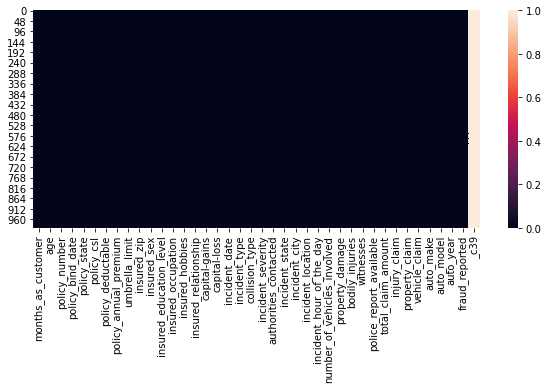

In [12]:
# Visualizing the null values
plt.figure(figsize=[10,4])
sns.heatmap(df_icf.isnull())

No null values present in this dataset.

In [13]:
df_icf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In `_c39` all values are non-null which means all the values in the column are NaN values, so we can drop this column.

In [14]:
# Dropping column
df_icf = df_icf.drop(["_c39"],axis=1)

In [15]:
#Checking unique values of each column
df_icf.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

`policy_number` and `incident_location` both the columns have 1000 unique count which means all the values in this categorical columns are unique. We can drop these columns as they would be not of much use in model buliding.

In [16]:
#Droping policy_number and incident_location column
df_icf = df_icf.drop(["policy_number"],axis=1)
df_icf = df_icf.drop(["incident_location"],axis=1)

In [17]:
df_icf.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


In [18]:
# Mean of our target variable 'fraud_reported'
df_icf.groupby('fraud_reported').mean()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
fraud_reported,,,,,,,,,,,,,,,,,
N,202.600266,38.884462,1130.810093,1258.430000,1.023904e+06,500419.537849,25432.005312,-26554.581673,11.626826,1.808765,0.976096,1.455511,50288.605578,7179.229748,7018.884462,36090.491368,2005.075697
Y,208.080972,39.141700,1151.821862,1250.236275,1.336032e+06,503637.959514,24193.522267,-27522.672065,11.696356,1.931174,1.040486,1.582996,60302.105263,8208.340081,8560.121457,43533.643725,2005.186235


In [19]:
# Value counts of each column.
for i in df_icf.columns:
        print(df_icf[i].value_counts())
        print('-----------------------------------------------------')

194    8
254    7
210    7
101    7
140    7
      ..
312    1
62     1
309    1
308    1
0      1
Name: months_as_customer, Length: 391, dtype: int64
-----------------------------------------------------
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
35    32
44    32
36    32
42    32
28    30
45    26
26    26
48    25
47    24
27    24
57    16
55    14
25    14
49    14
50    13
53    13
24    10
54    10
61    10
51     9
60     9
56     8
58     8
23     7
21     6
59     5
52     4
62     4
63     2
64     2
20     1
22     1
19     1
Name: age, dtype: int64
-----------------------------------------------------
28-04-1992    3
01-01-2006    3
05-08-1992    3
28-12-1991    2
25-12-2013    2
             ..
29-10-1993    1
13-04-2006    1
02-10-1992    1
02-10-1990    1
20-05-1995    1
Name: policy_bind_date, Length: 951, dtype: int64
-----------------------------------------------------
OH    352
IL    338
IN 

By looking at the value counts of each column we can see that the columns `umbrella_limit, capital-gains` and `capital-loss` contain more zero values around 80 %, 50 % and 45 % respectively. We shall keep the zero values in `capital_gains` and `capital_loss` columns as it is. Since, the umbrella_limit columns has more that 70% of zero values, let's drop that column.

In [20]:
# Droping umbrella_limit column
df_icf=df_icf.drop(["umbrella_limit"],axis=1)

The column `insured_zip` is the zip code given to each person. If we take a look at the value count and unique values of the column insured_zip, it contains 995 unique values that means the remaining 5 entries are repeating. Since it is giving some information about the person, we shall drop this column.

In [21]:
# Dropping insured_zip column as it is not important for the prediction
df_icf.drop('insured_zip',axis=1,inplace=True)

And we can also notice some `'?'` values in the columns, `collision type`,`property_damage` & `police_report_available`, so we have to replace them.

In [22]:
# Mode of column
df_icf["collision_type"].mode()

0    Rear Collision
dtype: object

In [23]:
# Replacing '?' with mode value
df_icf['collision_type'] = df_icf.collision_type.str.replace('?', 'Rear Collision')

In [24]:
#Checking the value counts of property_damage column
df_icf.property_damage.value_counts()

?      360
NO     338
YES    302
Name: property_damage, dtype: int64

In [25]:
#Replacing '?' with mode value
df_icf['property_damage'] = df_icf.property_damage.str.replace('?', 'NO')

In [26]:
#Checking the value counts of police_report_available column
df_icf.police_report_available.value_counts()

?      343
NO     343
YES    314
Name: police_report_available, dtype: int64

In [27]:
#Replacing '?' with mode value
df_icf['police_report_available'] = df_icf.police_report_available.str.replace('?', 'NO')

# Feature Extraction

In [28]:
import datetime as dt

In [29]:
#Converting object data type to datetime 
df_icf['policy_bind_date'] =  pd.to_datetime(df_icf['policy_bind_date'])
df_icf['incident_date'] =  pd.to_datetime(df_icf['incident_date'])

In [30]:
df_icf.dtypes

months_as_customer                      int64
age                                     int64
policy_bind_date               datetime64[ns]
policy_state                           object
policy_csl                             object
policy_deductable                       int64
policy_annual_premium                 float64
insured_sex                            object
insured_education_level                object
insured_occupation                     object
insured_hobbies                        object
insured_relationship                   object
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                          object
collision_type                         object
incident_severity                      object
authorities_contacted                  object
incident_state                         object
incident_city                          object
incident_hour_of_the_day          

Extracting policy_bind `year`, `month` and `day` from `policy_bind_date`.

In [31]:
# Extracting year
df_icf["policy_bind_year"]=pd.to_datetime(df_icf.policy_bind_date, format="%d/%m/%Y").dt.year

# Extracting month
df_icf["policy_bind_month"]=pd.to_datetime(df_icf.policy_bind_date, format="%d/%m/%Y").dt.month

# Extracting day
df_icf["policy_bind_day"]=pd.to_datetime(df_icf.policy_bind_date, format="%d/%m/%Y").dt.day

In [32]:
# Droping policy_bind_date column after extraction
df_icf = df_icf.drop(["policy_bind_date"],axis=1)

Extracting incident `year`, `month` and `day` from `incident_date`.

In [33]:
# Extracting year
df_icf["incident_year"]=pd.to_datetime(df_icf.incident_date, format="%d/%m/%Y").dt.year

# Extracting month
df_icf["incident_month"]=pd.to_datetime(df_icf.incident_date, format="%d/%m/%Y").dt.month

# Extracting day
df_icf["incident_day"]=pd.to_datetime(df_icf.incident_date, format="%d/%m/%Y").dt.day

In [34]:
# Droping incident_date column after extraction
df_icf = df_icf.drop(["incident_date"],axis=1)

`incident_year` has only one unique value so it does not help for model training so let me drop that column.

In [35]:
# Droping incident_year column after extraction
df_icf = df_icf.drop(["incident_year"],axis=1)

By taking `policy_csl` column, lets extract two other columns.

In [36]:
# Extracting columns from policy_csl
df_icf['csl_per_person'] = df_icf.policy_csl.str.split('/', expand=True)[0]
df_icf['csl_per_accident'] = df_icf.policy_csl.str.split('/', expand=True)[1]

In [37]:
# Changing dtype of extracted column
df_icf[['csl_per_person']] = df_icf[['csl_per_person']].astype('int64')
df_icf[['csl_per_accident']] = df_icf[['csl_per_accident']].astype('int64')

In [38]:
# Droping policy_csl column after extraction
df_icf=df_icf.drop(["policy_csl"],axis=1)

Extracting auto_age from auto year.

In [39]:
df_icf['auto_age'] = 2018 - df_icf['auto_year']

In [40]:
df_icf['auto_age']

0      14
1      11
2      11
3       4
4       9
       ..
995    12
996     3
997    22
998    20
999    11
Name: auto_age, Length: 1000, dtype: int64

In [41]:
# Droping auto_year column after extraction
df_icf = df_icf.drop(["auto_year"],axis=1)

In [42]:
df_icf.shape

(1000, 39)

In [43]:
df_icf["fraud_reported"].unique()

array(['Y', 'N'], dtype=object)

In [44]:
df_icf['fraud_reported'].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

In [45]:
#Checking for any empty observation in target column
df_icf.loc[df_icf['fraud_reported'] == " "]

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day,csl_per_person,csl_per_accident,auto_age


No empty observations in target column.

# Data Visualization

In [46]:
df_icf.nunique()

months_as_customer             391
age                             46
policy_state                     3
policy_deductable                3
policy_annual_premium          991
insured_sex                      2
insured_education_level          7
insured_occupation              14
insured_hobbies                 20
insured_relationship             6
capital-gains                  338
capital-loss                   354
incident_type                    4
collision_type                   3
incident_severity                4
authorities_contacted            5
incident_state                   7
incident_city                    7
incident_hour_of_the_day        24
number_of_vehicles_involved      4
property_damage                  2
bodily_injuries                  3
witnesses                        4
police_report_available          2
total_claim_amount             763
injury_claim                   638
property_claim                 626
vehicle_claim                  726
auto_make           

In [47]:
# Categorical Columns
categorical_columns=[]
for i in df_icf.dtypes.index:
    if df_icf.dtypes[i]=='object':
        categorical_columns.append(i)
print(categorical_columns)

['policy_state', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


In [48]:
# Numerical Columns
numerical_columns=[]
for i in df_icf.dtypes.index:
    if df_icf.dtypes[i]!='object':
        numerical_columns.append(i)
print(numerical_columns)

['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'policy_bind_year', 'policy_bind_month', 'policy_bind_day', 'incident_month', 'incident_day', 'csl_per_person', 'csl_per_accident', 'auto_age']


## Uni-Variate Analysis

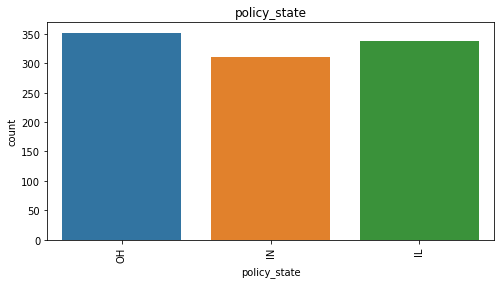

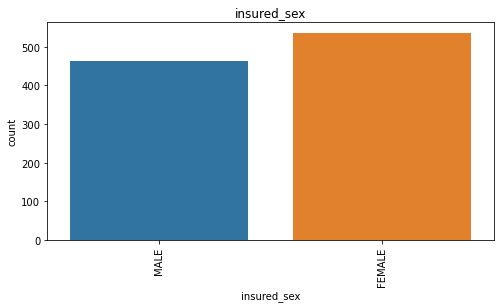

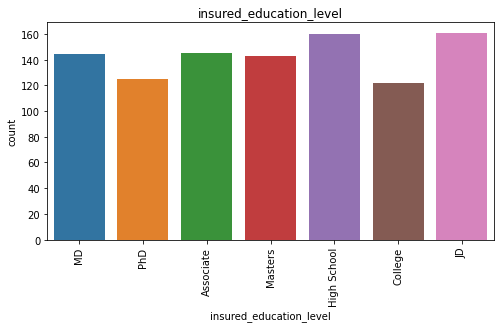

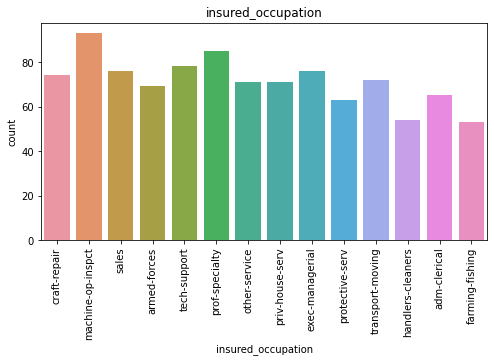

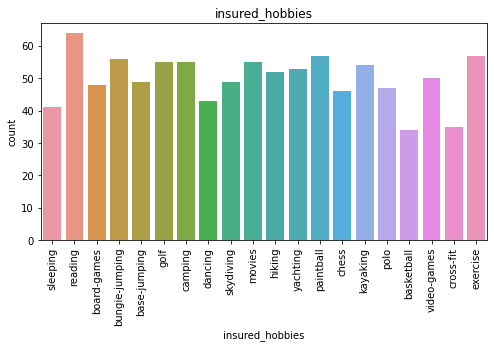

...

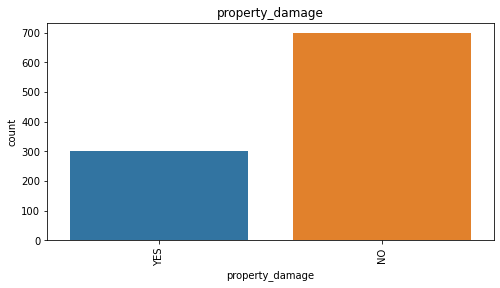

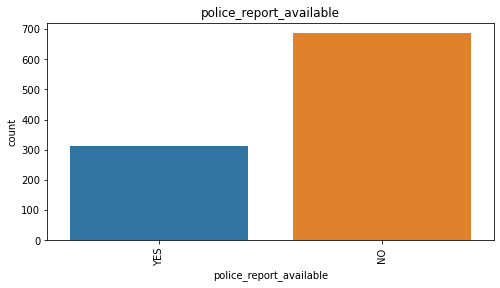

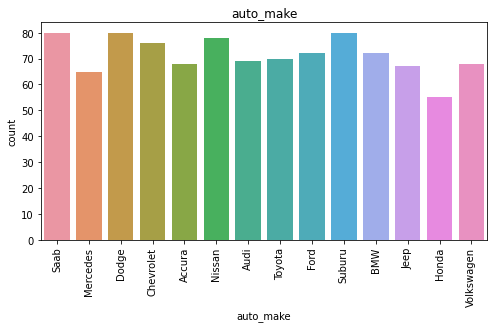

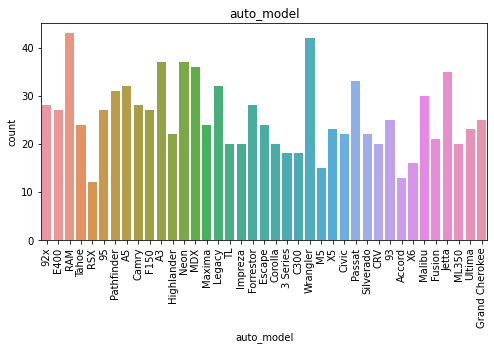

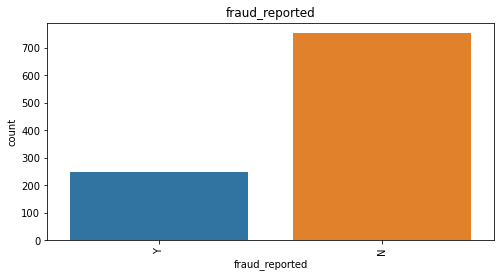

In [49]:
for i in df_icf[categorical_columns]:              
    plt.figure(figsize = (8, 4))
    sns.countplot(df_icf[i])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

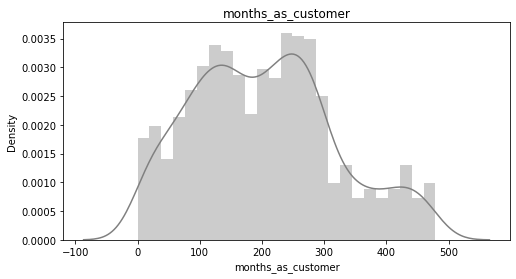

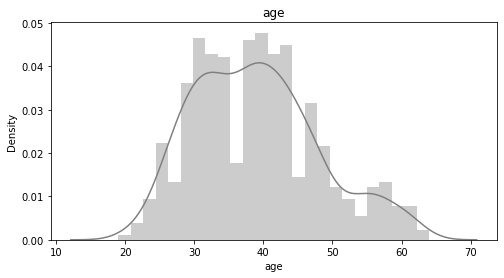

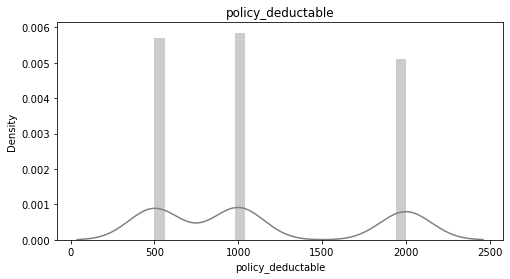

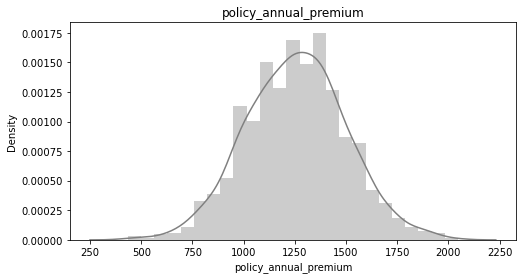

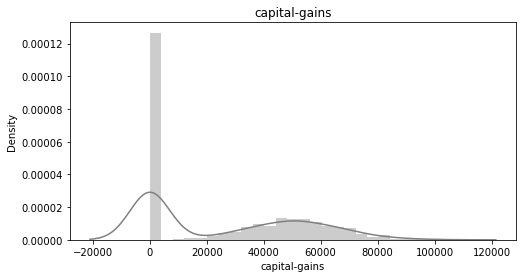

...

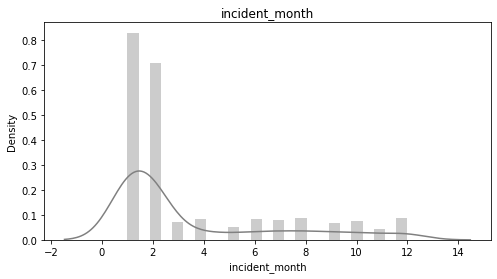

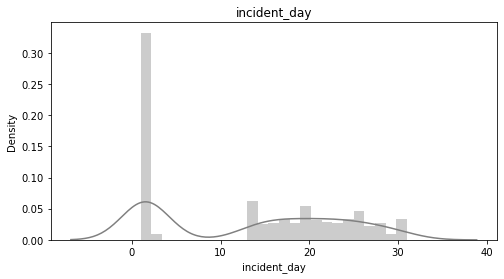

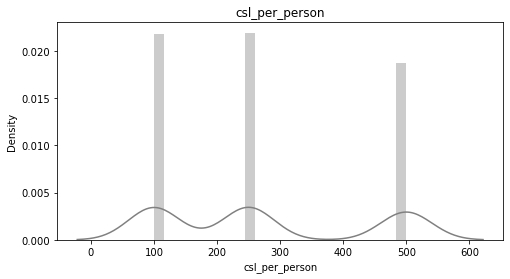

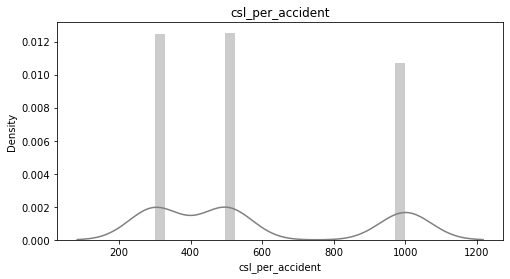

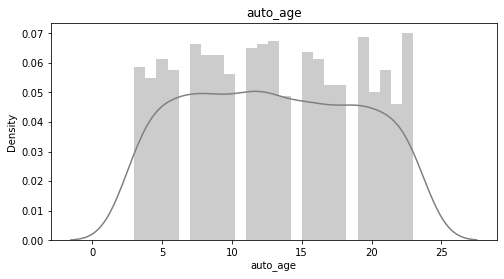

In [50]:
for i in df_icf[numerical_columns]:              
    plt.figure(figsize = (8, 4))
    sns.distplot(df_icf[i], bins = 25, color="grey")
    plt.title(i)
    plt.show()

N    753
Y    247
Name: fraud_reported, dtype: int64


<AxesSubplot:ylabel='fraud_reported'>

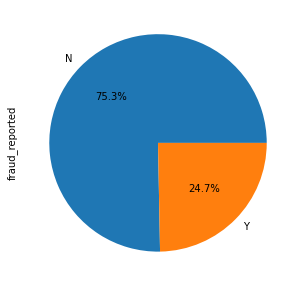

In [51]:
plt.figure(figsize=(10,5))
print(df_icf['fraud_reported'].value_counts())
df_icf['fraud_reported'].value_counts().plot.pie(autopct='%1.1f%%')

## Bi-Variate Analysis

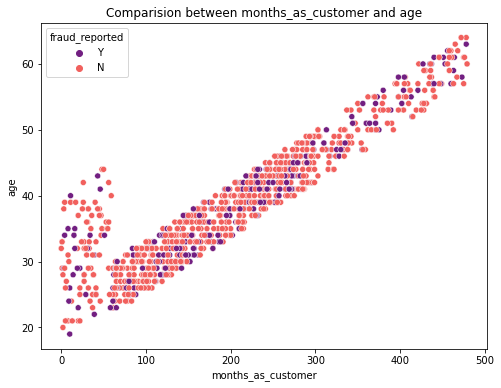

In [52]:
plt.figure(figsize=[8,6])
plt.title('Comparision between months_as_customer and age')
sns.scatterplot(df_icf['months_as_customer'],df_icf['age'],hue=df_icf['fraud_reported'],palette="magma");

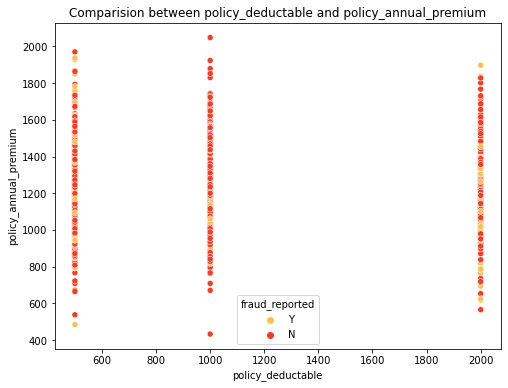

In [53]:
plt.figure(figsize=[8,6])
plt.title('Comparision between policy_deductable and policy_annual_premium')
sns.scatterplot(df_icf['policy_deductable'],df_icf['policy_annual_premium'],hue=df_icf['fraud_reported'],palette="YlOrRd");

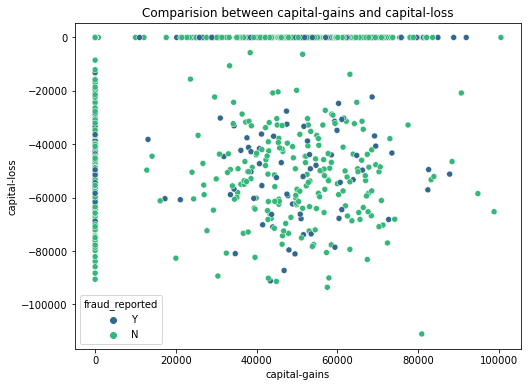

In [54]:
plt.figure(figsize=[8,6])
plt.title('Comparision between capital-gains and capital-loss')
sns.scatterplot(df_icf['capital-gains'],df_icf['capital-loss'],hue=df_icf['fraud_reported'],palette="viridis");

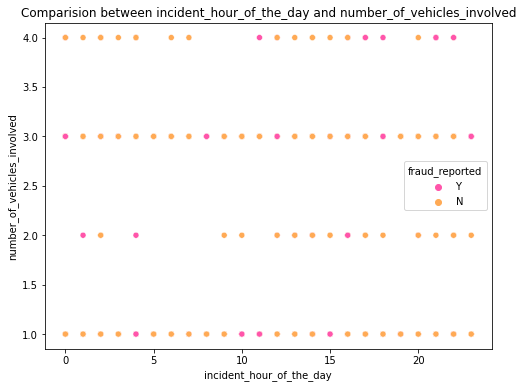

In [55]:
plt.figure(figsize=[8,6])
plt.title('Comparision between incident_hour_of_the_day and number_of_vehicles_involved')
sns.scatterplot(df_icf['incident_hour_of_the_day'],df_icf['number_of_vehicles_involved'],hue=df_icf['fraud_reported'],palette="spring");

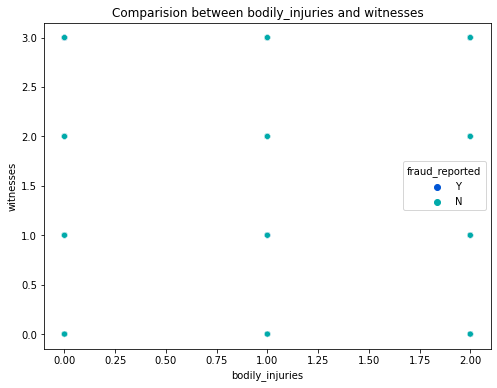

In [56]:
plt.figure(figsize=[8,6])
plt.title('Comparision between bodily_injuries and witnesses')
sns.scatterplot(df_icf['bodily_injuries'],df_icf['witnesses'],hue=df_icf['fraud_reported'],palette="winter");

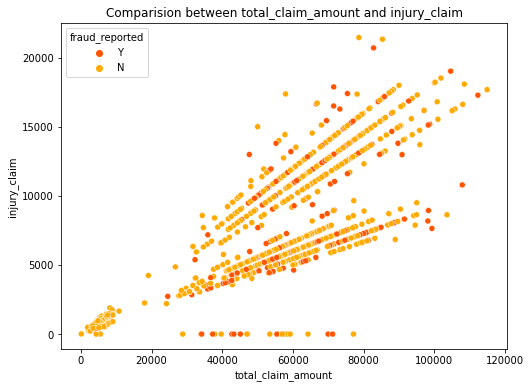

In [57]:
plt.figure(figsize=[8,6])
plt.title('Comparision between total_claim_amount and injury_claim')
sns.scatterplot(df_icf['total_claim_amount'],df_icf['injury_claim'],hue=df_icf['fraud_reported'],palette="autumn");

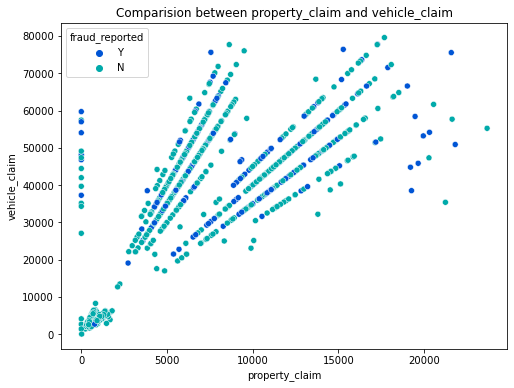

In [58]:
plt.figure(figsize=[8,6])
plt.title('Comparision between property_claim and vehicle_claim')
sns.scatterplot(df_icf['property_claim'],df_icf['vehicle_claim'],hue=df_icf['fraud_reported'],palette="winter");

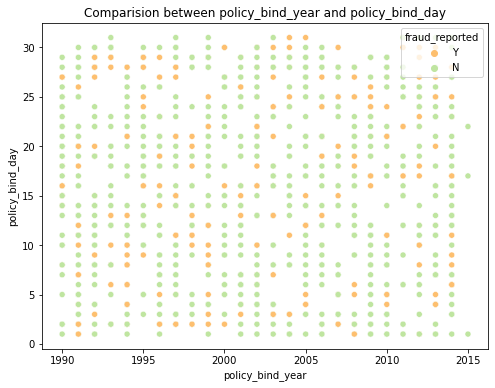

In [59]:
plt.figure(figsize=[8,6])
plt.title('Comparision between policy_bind_year and policy_bind_day')
sns.scatterplot(df_icf['policy_bind_year'],df_icf['policy_bind_day'],hue=df_icf['fraud_reported'],palette="Spectral");

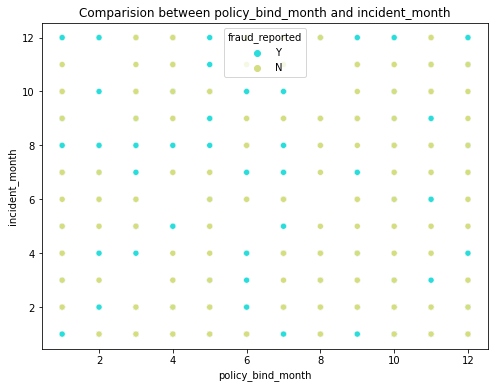

In [60]:
plt.figure(figsize=[8,6])
plt.title('Comparision between policy_bind_month and incident_month')
sns.scatterplot(df_icf['policy_bind_month'],df_icf['incident_month'],hue=df_icf['fraud_reported'],palette="rainbow");

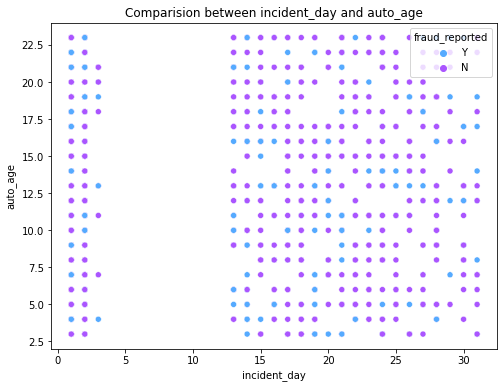

In [61]:
plt.figure(figsize=[8,6])
plt.title('Comparision between incident_day and auto_age')
sns.scatterplot(df_icf['incident_day'],df_icf['auto_age'],hue=df_icf['fraud_reported'],palette="cool");

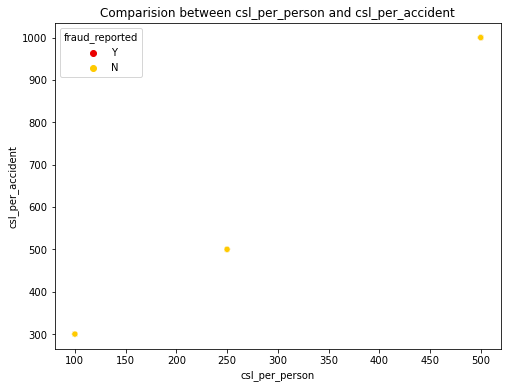

In [62]:
plt.figure(figsize=[8,6])
plt.title('Comparision between csl_per_person and csl_per_accident')
sns.scatterplot(df_icf['csl_per_person'],df_icf['csl_per_accident'],hue=df_icf['fraud_reported'],palette="hot");

<AxesSubplot:xlabel='policy_state', ylabel='count'>

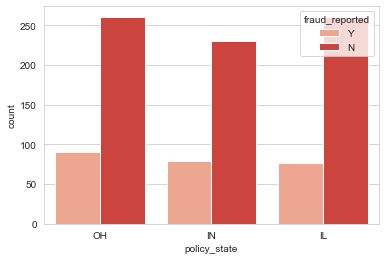

In [63]:
sns.set_style('whitegrid')
sns.countplot(x='policy_state',hue='fraud_reported',data=df_icf,palette='Reds')

<AxesSubplot:xlabel='insured_sex', ylabel='count'>

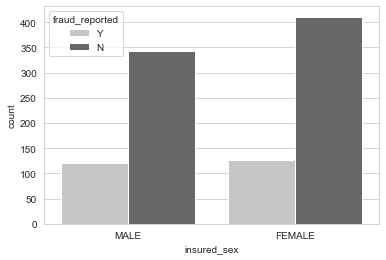

In [64]:
sns.set_style('whitegrid')
sns.countplot(x='insured_sex',hue='fraud_reported',data=df_icf,palette='Greys')

<AxesSubplot:xlabel='insured_education_level', ylabel='count'>

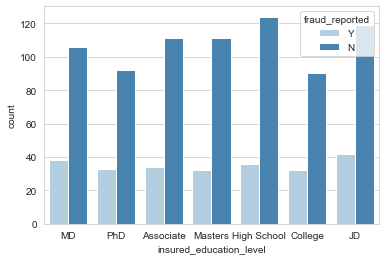

In [65]:
sns.set_style('whitegrid')
sns.countplot(x='insured_education_level',hue='fraud_reported',data=df_icf,palette='Blues')

<AxesSubplot:xlabel='insured_occupation', ylabel='count'>

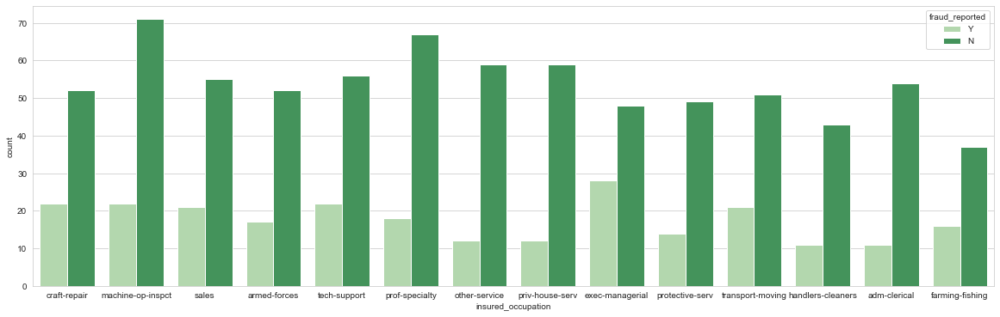

In [66]:
plt.figure(figsize=[20,6])
sns.set_style('whitegrid')
sns.countplot(x='insured_occupation',hue='fraud_reported',data=df_icf,palette='Greens')

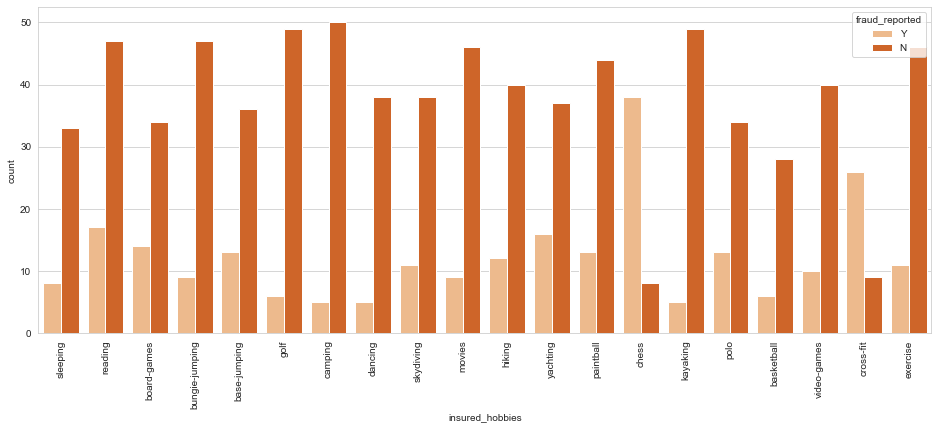

In [67]:
plt.figure(figsize=[16,6])
sns.set_style('whitegrid')
sns.countplot(x='insured_hobbies',hue='fraud_reported',data=df_icf,palette='Oranges')
plt.xticks(rotation=90);

<AxesSubplot:xlabel='insured_relationship', ylabel='count'>

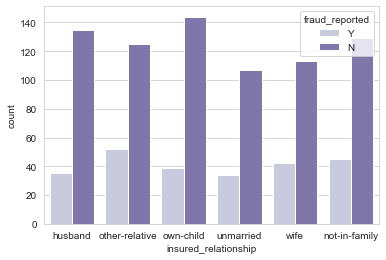

In [68]:
sns.set_style('whitegrid')
sns.countplot(x='insured_relationship',hue='fraud_reported',data=df_icf,palette='Purples')

<AxesSubplot:xlabel='incident_type', ylabel='count'>

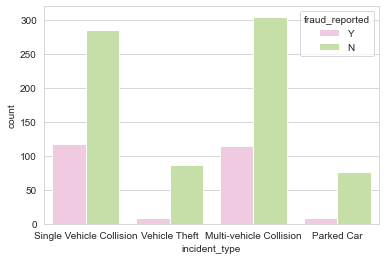

In [69]:
sns.set_style('whitegrid')
sns.countplot(x='incident_type',hue='fraud_reported',data=df_icf,palette='PiYG')

<AxesSubplot:xlabel='collision_type', ylabel='count'>

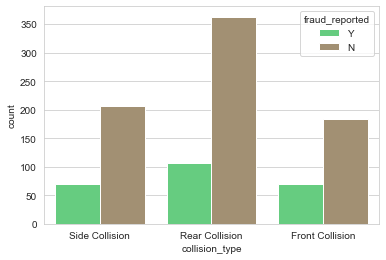

In [70]:
sns.set_style('whitegrid')
sns.countplot(x='collision_type',hue='fraud_reported',data=df_icf,palette='terrain')

<AxesSubplot:xlabel='incident_severity', ylabel='count'>

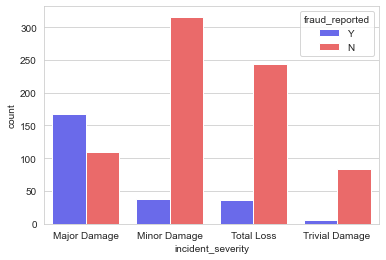

In [71]:
sns.set_style('whitegrid')
sns.countplot(x='incident_severity',hue='fraud_reported',data=df_icf,palette='seismic')

<AxesSubplot:xlabel='authorities_contacted', ylabel='count'>

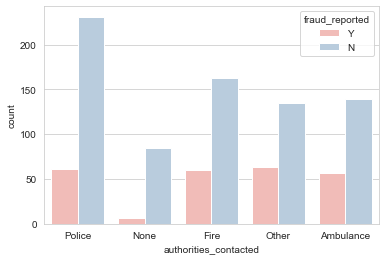

In [72]:
sns.set_style('whitegrid')
sns.countplot(x='authorities_contacted',hue='fraud_reported',data=df_icf,palette='Pastel1')

<AxesSubplot:xlabel='incident_state', ylabel='count'>

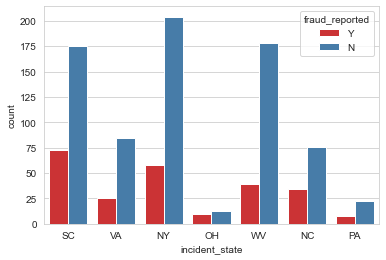

In [73]:
sns.set_style('whitegrid')
sns.countplot(x='incident_state',hue='fraud_reported',data=df_icf,palette='Set1')

<AxesSubplot:xlabel='incident_city', ylabel='count'>

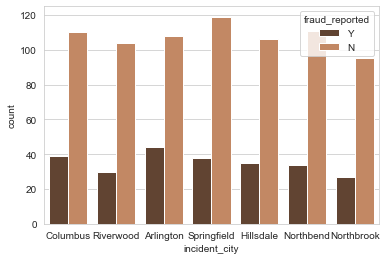

In [74]:
sns.set_style('whitegrid')
sns.countplot(x='incident_city',hue='fraud_reported',data=df_icf,palette='copper')

<AxesSubplot:xlabel='property_damage', ylabel='count'>

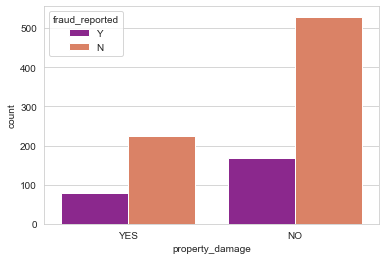

In [75]:
sns.set_style('whitegrid')
sns.countplot(x='property_damage',hue='fraud_reported',data=df_icf,palette='plasma')

<AxesSubplot:xlabel='police_report_available', ylabel='count'>

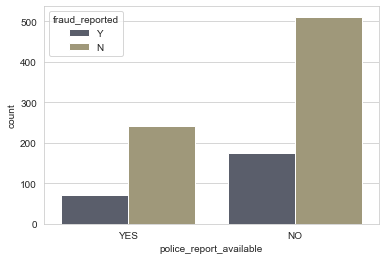

In [76]:
sns.set_style('whitegrid')
sns.countplot(x='police_report_available',hue='fraud_reported',data=df_icf,palette='cividis')

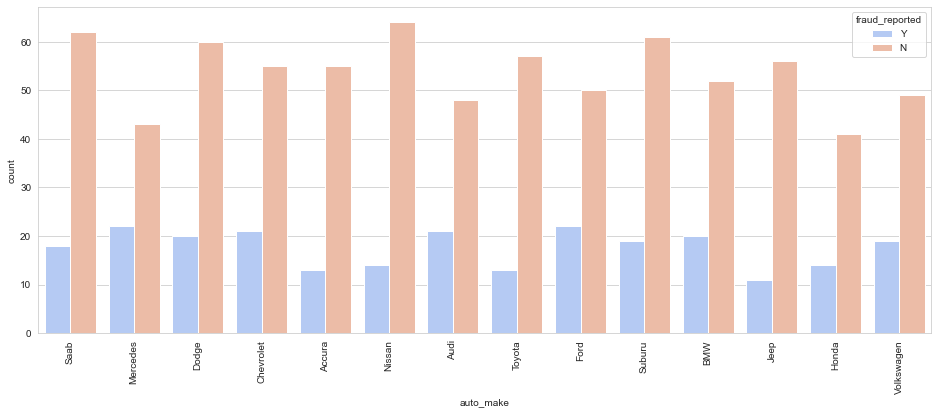

In [77]:
plt.figure(figsize=[16,6])
sns.set_style('whitegrid')
sns.countplot(x='auto_make',hue='fraud_reported',data=df_icf,palette='coolwarm')
plt.xticks(rotation=90);

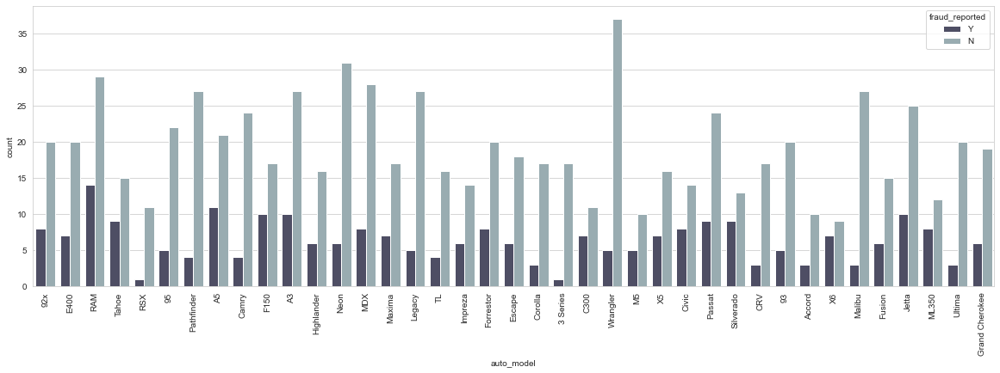

In [78]:
plt.figure(figsize=[20,6])
sns.set_style('whitegrid')
sns.countplot(x='auto_model',hue='fraud_reported',data=df_icf,palette='bone')
plt.xticks(rotation=90);

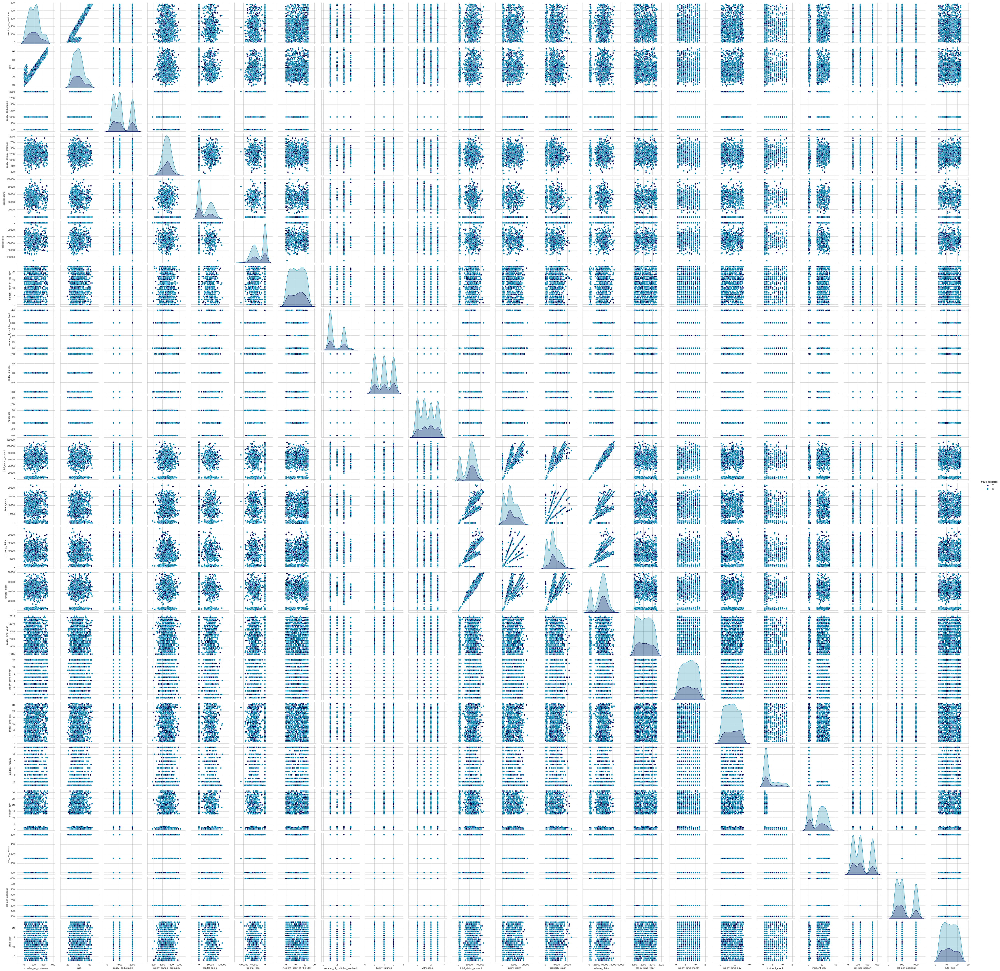

In [79]:
sns.pairplot(df_icf,hue="fraud_reported",palette='ocean')

# Encoding the Data Frame

In [80]:
df_icf.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_deductable',
       'policy_annual_premium', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'capital-gains', 'capital-loss', 'incident_type', 'collision_type',
       'incident_severity', 'authorities_contacted', 'incident_state',
       'incident_city', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'fraud_reported', 'policy_bind_year', 'policy_bind_month',
       'policy_bind_day', 'incident_month', 'incident_day', 'csl_per_person',
       'csl_per_accident', 'auto_age'],
      dtype='object')

In [81]:
df_icf.dtypes

months_as_customer               int64
age                              int64
policy_state                    object
policy_deductable                int64
policy_annual_premium          float64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries                  int64
witnesses                        int64
police_report_available         object
total_claim_amount               int64
injury_claim             

Label Encoder is used to encode the dataframe to make it easier to build the model.

In [82]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

In [83]:
df_icf[categorical_columns]= df_icf[categorical_columns].apply(le.fit_transform)

In [84]:
df_icf

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day,csl_per_person,csl_per_accident,auto_age
0,328,48,2,1000,1406.91,1,4,2,17,0,53300,0,2,2,0,4,4,1,5,1,1,1,2,1,71610,6510,13020,52080,10,1,1,2014,10,17,1,25,250,500,14
1,228,42,1,2000,1197.22,1,4,6,15,2,0,0,3,1,1,4,5,5,8,1,0,0,0,0,5070,780,780,3510,8,12,1,2006,6,27,1,21,250,500,11
2,134,29,2,2000,1413.14,0,6,11,2,3,35100,0,0,1,1,4,1,1,7,3,0,2,3,0,34650,7700,3850,23100,4,30,0,2000,6,9,2,22,100,300,11
3,256,41,0,2000,1415.74,0,6,1,2,4,48900,-62400,2,0,0,4,2,0,5,1,0,1,2,0,63400,6340,6340,50720,3,34,1,1990,5,25,10,1,250,500,4
4,228,44,0,1000,1583.91,1,0,11,2,4,66000,-46000,3,1,1,2,1,0,20,1,0,0,1,0,6500,1300,650,4550,0,31,0,2014,6,6,2,17,500,1000,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,1000,1310.80,0,5,2,13,4,0,0,2,0,1,1,0,4,20,1,1,0,1,0,87200,17440,8720,61040,6,6,0,1991,7,16,2,22,500,1000,12
996,285,41,0,1000,1436.79,0,6,9,17,5,70900,0,2,1,0,1,4,3,23,1,1,2,3,0,108480,18080,18080,72320,13,28,0,2014,5,1,1,24,100,300,3
997,130,34,2,500,1383.49,0,5,1,3,2,35100,0,0,2,1,4,0,0,4,3,0,2,3,1,67500,7500,7500,52500,11,19,0,2003,2,17,1,23,250,500,22
998,458,62,0,2000,1356.92,1,0,5,0,5,0,0,2,1,0,3,1,0,2,1,0,0,1,1,46980,5220,5220,36540,1,5,0,2011,11,18,2,26,500,1000,20


# Outliers

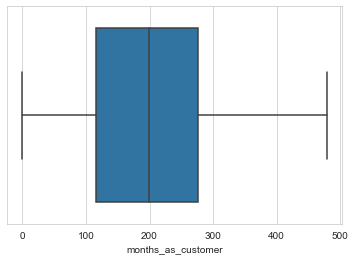

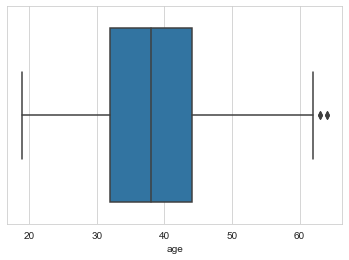

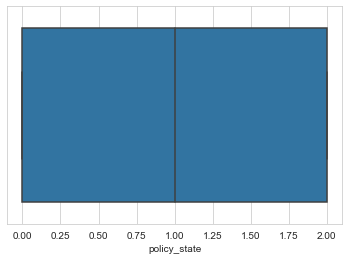

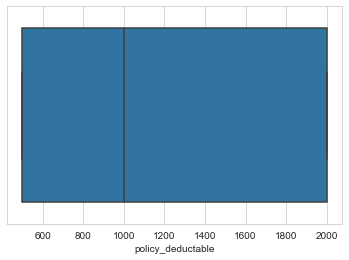

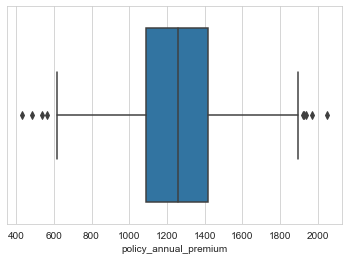

...

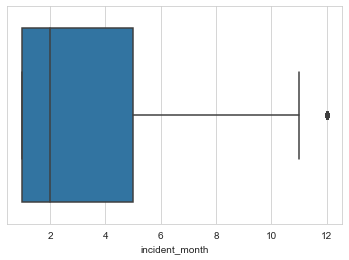

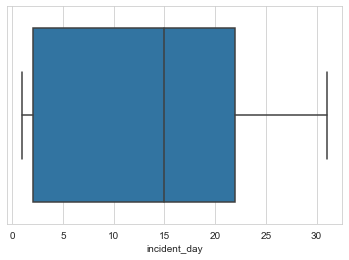

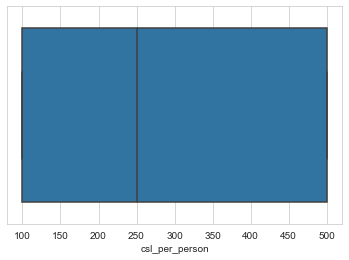

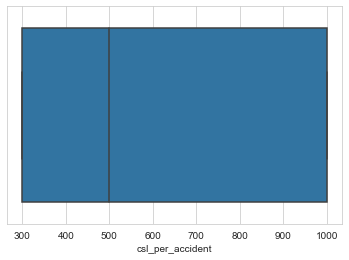

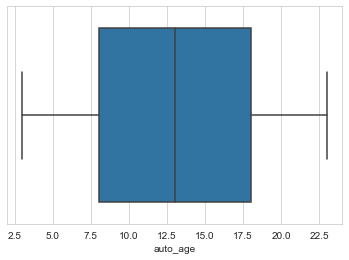

In [85]:
for i in df_icf.columns:
    sns.boxplot(df_icf[i])
    plt.show()

months_as_customer                 AxesSubplot(0.125,0.71587;0.0596154x0.16413)
age                             AxesSubplot(0.196538,0.71587;0.0596154x0.16413)
policy_state                    AxesSubplot(0.268077,0.71587;0.0596154x0.16413)
policy_deductable               AxesSubplot(0.339615,0.71587;0.0596154x0.16413)
policy_annual_premium           AxesSubplot(0.411154,0.71587;0.0596154x0.16413)
insured_sex                     AxesSubplot(0.482692,0.71587;0.0596154x0.16413)
insured_education_level         AxesSubplot(0.554231,0.71587;0.0596154x0.16413)
insured_occupation              AxesSubplot(0.625769,0.71587;0.0596154x0.16413)
insured_hobbies                 AxesSubplot(0.697308,0.71587;0.0596154x0.16413)
insured_relationship            AxesSubplot(0.768846,0.71587;0.0596154x0.16413)
capital-gains                   AxesSubplot(0.840385,0.71587;0.0596154x0.16413)
capital-loss                      AxesSubplot(0.125,0.518913;0.0596154x0.16413)
incident_type                  AxesSubpl

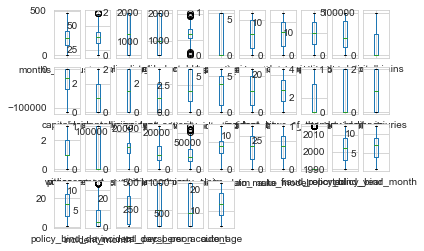

In [86]:
df_icf.plot(kind='box',subplots=True,layout=(4,11))

We can see outliers present in ` age, policy_annual_premium, total_claim_amount, property_claim, fraud_reported & incident_month`.

# Removing Outliers

We shall remove the outliers present in the dataset using Z-Score Method.

In [87]:
df_outliers=df_icf[["age", "policy_annual_premium", "total_claim_amount","property_claim","incident_month","fraud_reported"]]

In [88]:
from scipy.stats import zscore

z=np.abs(zscore(df_outliers))
df_ICFD=df_icf[(z<3).all(axis=1)]
df_ICFD

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day,csl_per_person,csl_per_accident,auto_age
0,328,48,2,1000,1406.91,1,4,2,17,0,53300,0,2,2,0,4,4,1,5,1,1,1,2,1,71610,6510,13020,52080,10,1,1,2014,10,17,1,25,250,500,14
1,228,42,1,2000,1197.22,1,4,6,15,2,0,0,3,1,1,4,5,5,8,1,0,0,0,0,5070,780,780,3510,8,12,1,2006,6,27,1,21,250,500,11
2,134,29,2,2000,1413.14,0,6,11,2,3,35100,0,0,1,1,4,1,1,7,3,0,2,3,0,34650,7700,3850,23100,4,30,0,2000,6,9,2,22,100,300,11
3,256,41,0,2000,1415.74,0,6,1,2,4,48900,-62400,2,0,0,4,2,0,5,1,0,1,2,0,63400,6340,6340,50720,3,34,1,1990,5,25,10,1,250,500,4
4,228,44,0,1000,1583.91,1,0,11,2,4,66000,-46000,3,1,1,2,1,0,20,1,0,0,1,0,6500,1300,650,4550,0,31,0,2014,6,6,2,17,500,1000,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,1000,1310.80,0,5,2,13,4,0,0,2,0,1,1,0,4,20,1,1,0,1,0,87200,17440,8720,61040,6,6,0,1991,7,16,2,22,500,1000,12
996,285,41,0,1000,1436.79,0,6,9,17,5,70900,0,2,1,0,1,4,3,23,1,1,2,3,0,108480,18080,18080,72320,13,28,0,2014,5,1,1,24,100,300,3
997,130,34,2,500,1383.49,0,5,1,3,2,35100,0,0,2,1,4,0,0,4,3,0,2,3,1,67500,7500,7500,52500,11,19,0,2003,2,17,1,23,250,500,22
998,458,62,0,2000,1356.92,1,0,5,0,5,0,0,2,1,0,3,1,0,2,1,0,0,1,1,46980,5220,5220,36540,1,5,0,2011,11,18,2,26,500,1000,20


In [89]:
df_ICFD.shape

(996, 39)

In [90]:
df_icf.shape

(1000, 39)

In [91]:
Data_loss=((1000-996)/1000)*100
Data_loss

0.4

Data loss after applying Z-Score Method to remove outliers is `0.4 %`.

# Skewness

In [92]:
df_ICFD.skew()

months_as_customer             0.359605
age                            0.474526
policy_state                  -0.028155
policy_deductable              0.473229
policy_annual_premium          0.032042
insured_sex                    0.145176
insured_education_level        0.001349
insured_occupation            -0.063714
insured_hobbies               -0.060160
insured_relationship           0.076423
capital-gains                  0.478850
capital-loss                  -0.393015
incident_type                  0.102917
collision_type                -0.033826
incident_severity              0.275635
authorities_contacted         -0.120741
incident_state                -0.144616
incident_city                  0.046459
incident_hour_of_the_day      -0.039123
number_of_vehicles_involved    0.500364
property_damage                0.857547
bodily_injuries                0.011117
witnesses                      0.025758
police_report_available        0.806478
total_claim_amount            -0.593473


There is skewness in `age, policy_deductable ,number_of_vehicles_involved, property_damage, police_report_available, total_claim_amount, vehicle_claim, csl_per_accident, incident_month.`

In [93]:
df_skew=["age", "policy_deductable", "number_of_vehicles_involved","property_damage","police_report_available","total_claim_amount","vehicle_claim","csl_per_accident","incident_month"]

We shall use Power Transformer to remove skewness.

In [94]:
from sklearn.preprocessing import PowerTransformer
scal = PowerTransformer(method='yeo-johnson')

In [95]:
df_ICFD[df_skew] = scal.fit_transform(df_ICFD[df_skew].values)

In [96]:
df_ICFD[df_skew].skew()

age                           -0.002306
policy_deductable              0.022778
number_of_vehicles_involved    0.361213
property_damage                0.857547
police_report_available        0.806478
total_claim_amount            -0.508953
vehicle_claim                 -0.521354
csl_per_accident               0.110964
incident_month                 0.305741
dtype: float64

Skewness in all columns is reduced.

In [97]:
df_ICFD

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day,csl_per_person,csl_per_accident,auto_age
0,328,1.005252,2,0.064182,1406.91,1,4,2,17,0,53300,0,2,2,0,4,4,1,5,-0.844799,1.515920,1,2,1.480644,0.717556,6510,13020,0.754553,10,1,1,2014,10,17,-1.101370,25,250,0.052612,14
1,228,0.426872,1,1.269641,1197.22,1,4,6,15,2,0,0,3,1,1,4,5,5,8,-0.844799,-0.659665,0,0,-0.675382,-1.777785,780,780,-1.787353,8,12,1,2006,6,27,-1.101370,21,250,0.052612,11
2,134,-1.143091,2,1.269641,1413.14,0,6,11,2,3,35100,0,0,1,1,4,1,1,7,1.187846,-0.659665,2,3,-0.675382,-0.716483,7700,3850,-0.820820,4,30,0,2000,6,9,-0.026479,22,100,-1.174021,11
3,256,0.323178,0,1.269641,1415.74,0,6,1,2,4,48900,-62400,2,0,0,4,2,0,5,-0.844799,-0.659665,1,2,-0.675382,0.392931,6340,6340,0.678427,3,34,1,1990,5,25,1.553647,1,250,0.052612,4
4,228,0.627644,0,0.064182,1583.91,1,0,11,2,4,66000,-46000,3,1,1,2,1,0,20,-0.844799,-0.659665,0,1,-0.675382,-1.730555,1300,650,-1.740710,0,31,0,2014,6,6,-0.026479,17,500,1.313327,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,-0.002408,2,0.064182,1310.80,0,5,2,13,4,0,0,2,0,1,1,0,4,20,-0.844799,1.515920,0,1,-0.675382,1.341314,17440,8720,1.260237,6,6,0,1991,7,16,-0.026479,22,500,1.313327,12
996,285,0.323178,0,0.064182,1436.79,0,6,9,17,5,70900,0,2,1,0,1,4,3,23,-0.844799,1.515920,2,3,-0.675382,2.205819,18080,18080,1.906028,13,28,0,2014,5,1,-1.101370,24,100,-1.174021,3
997,130,-0.475146,2,-1.212292,1383.49,0,5,1,3,2,35100,0,0,2,1,4,0,0,4,1.187846,-0.659665,2,3,1.480644,0.554684,7500,7500,0.778098,11,19,0,2003,2,17,-1.101370,23,250,0.052612,22
998,458,2.131369,0,1.269641,1356.92,1,0,5,0,5,0,0,2,1,0,3,1,0,2,-0.844799,-0.659665,0,1,1.480644,-0.246683,5220,5220,-0.103792,1,5,0,2011,11,18,-0.026479,26,500,1.313327,20


# Correlation

In [98]:
df_ICFD.corr()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day,csl_per_person,csl_per_accident,auto_age
months_as_customer,1.000000,0.906668,0.000118,0.014276,-0.003378,0.059002,-0.000848,0.005365,-0.092575,0.071097,0.007601,0.020771,-0.017202,-0.072479,-0.061932,0.011406,0.006906,-0.001837,0.068962,0.015588,0.002663,-0.011126,0.063530,-0.018760,0.064662,0.066416,0.041157,0.062392,0.049222,0.002908,0.020966,-0.046010,0.004955,0.054175,0.019029,-0.013502,-0.022063,-0.022928,-0.001287
age,0.906668,1.000000,-0.018542,0.017005,0.011841,0.070153,0.004480,0.016209,-0.081359,0.071422,-0.003788,0.006479,-0.023316,-0.070132,-0.048919,0.011303,0.009744,0.001465,0.084616,0.020118,-0.008454,-0.014579,0.057233,-0.015089,0.062867,0.073406,0.059409,0.053082,0.028703,0.014396,0.006381,-0.035127,0.016876,0.049879,0.016389,-0.001879,-0.012788,-0.013026,-0.004684
policy_state,0.000118,-0.018542,1.000000,0.009652,0.014475,-0.019294,-0.032551,-0.031016,-0.040215,-0.018855,0.072552,-0.032268,0.031769,0.050953,-0.026728,-0.017738,0.009195,-0.004475,0.026464,-0.041368,-0.009334,0.008992,0.024809,0.065957,-0.008788,-0.046398,0.002678,-0.000472,0.015848,-0.024513,0.028864,-0.005709,0.071527,0.001030,0.026233,0.013370,-0.005866,-0.000653,-0.002323
policy_deductable,0.014276,0.017005,0.009652,1.000000,-0.003853,-0.014429,0.010422,-0.057290,-0.005443,-0.024111,0.030264,-0.023403,-0.037073,-0.047848,-0.011254,-0.010162,0.011818,-0.038955,0.066081,0.048586,0.013506,-0.019772,0.077963,0.044093,0.018921,0.035227,0.060077,0.000997,-0.028580,-0.004217,0.008507,-0.051224,-0.045982,-0.005223,-0.000499,-0.021494,0.006827,0.005135,-0.026450
policy_annual_premium,-0.003378,0.011841,0.014475,-0.003853,1.000000,0.041830,-0.021475,0.030963,-0.014376,0.006474,-0.009757,0.029835,0.049336,0.034999,-0.015788,-0.058852,0.049047,0.047389,-0.003001,-0.044719,0.078922,0.025323,0.006365,0.029619,0.002905,-0.024031,-0.007964,0.012961,0.011595,-0.034998,-0.010174,0.001650,-0.028452,-0.030886,-0.012386,0.016400,0.028569,0.030755,0.040439
insured_sex,0.059002,0.070153,-0.019294,-0.014429,0.041830,1.000000,0.007473,-0.009257,-0.019600,0.004104,-0.020651,-0.024440,0.010572,-0.014399,-0.029576,0.019000,-0.021822,0.013251,0.017950,0.013684,0.025911,-0.020201,0.044173,0.009884,-0.020117,0.004603,-0.009457,-0.026816,0.026040,-0.017679,0.032173,-0.031981,-0.007259,0.045694,0.024223,-0.007249,-0.019001,-0.008959,0.028638
insured_education_level,-0.000848,0.004480,-0.032551,0.010422,-0.021475,0.007473,1.000000,-0.021502,0.022806,-0.021595,0.040283,0.039890,0.012385,-0.020687,-0.007395,-0.011831,-0.006118,-0.019160,-0.057232,-0.001818,-0.048624,-0.011455,0.017577,0.054380,0.076528,0.083672,0.058663,0.070001,0.057528,0.050878,0.011520,0.017801,-0.007489,0.014464,0.069312,-0.055411,0.011093,0.010425,-0.045094
insured_occupation,0.005365,0.016209,-0.031016,-0.057290,0.030963,-0.009257,-0.021502,1.000000,-0.009818,-0.008141,-0.007553,-0.021993,0.003427,0.006634,0.002255,-0.007367,-0.021531,-0.002158,-0.021308,-0.014772,-0.018839,-0.001830,-0.011373,-0.021730,0.006458,0.022693,0.008301,0.000954,0.044321,0.020878,0.003335,-0.025282,0.024516,-0.003030,0.013226,-0.022786,0.018978,0.019575,0.004827
insured_hobbies,-0.092575,-0.081359,-0.040215,-0.005443,-0.014376,-0.019600,0.022806,-0.009818,1.000000,-0.097837,0.053503,-0.032345,0.008256,0.016756,-0.023999,-0.028153,0.085633,0.018605,0.019802,0.014908,0.036599,0.030730,-0.034308,-0.030149,-0.003759,0.028415,0.009925,-0.015968,-0.00005

In [99]:
df_ICFD.corr()['fraud_reported'].sort_values(ascending=False)

fraud_reported                 1.000000
vehicle_claim                  0.168862
total_claim_amount             0.162203
property_claim                 0.138572
injury_claim                   0.089900
policy_bind_day                0.059756
witnesses                      0.051283
number_of_vehicles_involved    0.046369
bodily_injuries                0.035484
insured_sex                    0.032173
policy_state                   0.028864
months_as_customer             0.020966
insured_relationship           0.017992
property_damage                0.017270
insured_education_level        0.011520
policy_deductable              0.008507
age                            0.006381
incident_hour_of_the_day       0.005863
insured_occupation             0.003335
policy_bind_year               0.001029
auto_model                    -0.001416
auto_age                      -0.004758
incident_month                -0.007073
policy_annual_premium         -0.010174
capital-loss                  -0.012552


<AxesSubplot:>

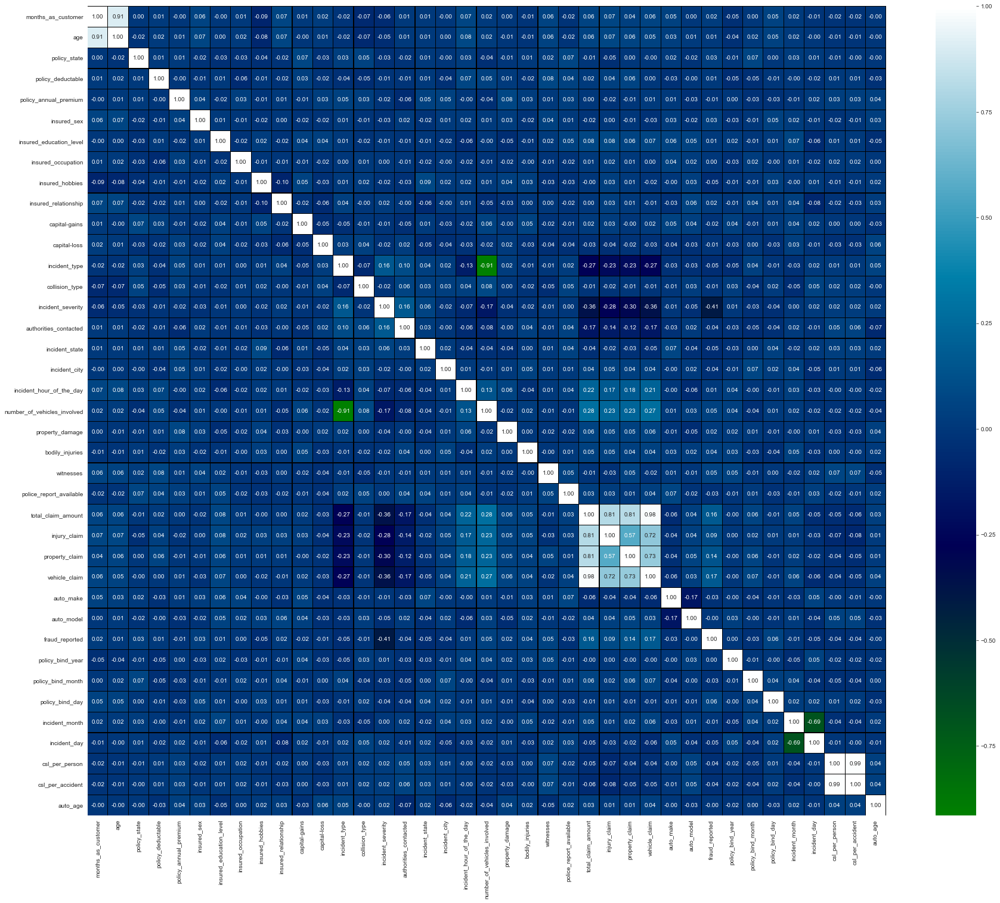

In [100]:
# Visualizing df_ICFD.corr() using heatmap
plt.figure(figsize=(30,25))
sns.heatmap(df_ICFD.corr(),annot=True,linewidths=0.1,linecolor="black",fmt=".2f",cmap="ocean")

From the above correlation map, we see that, there is very less correlation between the target variables and the other variables.  
We can observe the most of the columns are highly correlated with each other which leads to the multicollinearity problem.  
We will check the VIF value to overcome with this multicollinearity problem.

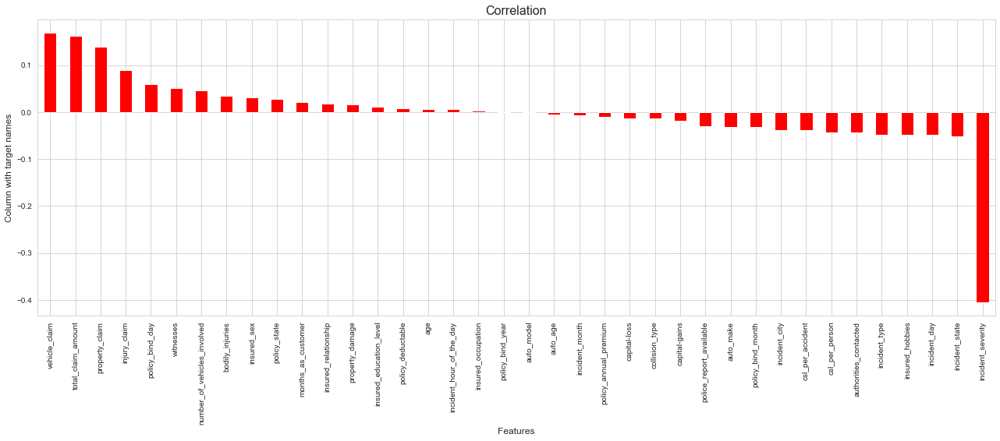

In [101]:
plt.figure(figsize=(22,7))
df_ICFD.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='r')
plt.xlabel('Features',fontsize=12)
plt.ylabel('Column with target names',fontsize=12)
plt.title('Correlation',fontsize=16)
plt.show()

`policy_bind_year & auto_model` are the lest correlated with target column. Next, `insured_occupation` is slighly correlated with the target variable. `auto_age and incident_hour_of_the_day` also less correlated with target.

`vehicle_claim, total_claim_amount & property_claim` are highly positively correlated with the target. `incident_severity`, is highly negatively correlated with the target.

# Model Building

In [102]:
x = df_ICFD.drop("fraud_reported",axis=1)
y = df_ICFD["fraud_reported"]

In [103]:
x.shape

(996, 38)

In [104]:
y.shape

(996,)

# Scaling

In [105]:
from sklearn.preprocessing import StandardScaler

scale = StandardScaler()
x = pd.DataFrame(scale.fit_transform(x), columns=x.columns)
x

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day,csl_per_person,csl_per_accident,auto_age
0,1.074671,1.005252,1.186130,0.064182,0.621371,1.075102,0.531088,-1.162296,1.280299,-1.436113,1.010158,0.953763,0.765670,1.343731,-1.261019,1.196829,0.352556,-0.964353,-0.959495,-0.844799,1.515920,0.007356,0.466826,1.480644,0.717556,-0.188161,1.174449,0.754553,0.857248,-1.644810,1.686176,1.013751,0.177487,-1.101370,1.139807,-0.137684,0.052612,0.182338
1,0.204846,0.426872,-0.018137,1.269641,-0.251375,1.075102,0.531088,-0.166257,0.928186,-0.246617,-0.900970,0.953763,1.690043,-0.030351,-0.197535,1.196829,0.815808,0.992846,-0.527592,-0.844799,-0.659665,-1.213749,-1.335340,-0.675382,-1.777785,-1.363038,-1.376935,-1.787353,0.360986,-0.657437,0.599693,-0.166145,1.309223,-1.101370,0.756374,-0.137684,0.052612,-0.316587
2,-0.612790,-1.143091,1.186130,1.269641,0.647301,-0.930144,1.557206,1.078792,-1.360550,0.348131,0.357578,0.953763,-1.083075,-0.030351,-0.197535,1.196829,-1.037202,-0.964353,-0.671560,1.187846,-0.659665,1.228462,1.367910,-0.675382,-0.716483,0.055836,-0.737005,-0.820820,-0.631538,0.958263,-0.215170,-0.166145,-0.727901,-0.026479,0.852233,-1.066352,-1.174021,-0.316587
3,0.448397,0.323178,-1.222403,1.269641,0.658123,-0.930144,1.557206,-1.411305,-1.360550,0.942878,0.852392,-1.269246,0.765670,-1.404433,-1.261019,1.196829,-0.573950,-1.453652,-0.959495,-0.844799,-0.659665,0.007356,0.466826,-0.675382,0.392931,-0.223018,-0.217973,0.678427,-0.879669,1.317308,-1.573274,-0.461119,1.082875,1.553647,-1.160788,-0.137684,0.052612,-1.480744
4,0.204846,0.627644,-1.222403,0.064182,1.358059,1.075102,-1.521148,1.078792,-1.360550,0.942878,1.465530,-0.684994,1.690043,-0.030351,-0.197535,-0.108088,-1.037202,-1.453652,1.200020,-0.844799,-0.659665,-1.213749,-0.434257,-0.675382,-1.730555,-1.256417,-1.404033,-1.740710,-1.624063,1.048024,1.686176,-0.166145,-1.067422,-0.026479,0.372942,1.410096,1.313327,-0.649203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,-1.752261,-0.002408,1.186130,0.064182,0.221354,-0.930144,1.044147,-1.162296,0.576073,0.942878,-0.900970,0.953763,0.765670,-1.404433,-0.197535,-0.760546,-1.500455,0.503546,1.200020,-0.844799,1.515920,-1.213749,-0.434257,-0.675382,1.341314,2.052922,0.278129,1.260237,-0.135276,-1.196004,-1.437463,0.128829,0.064313,-0.026479,0.852233,1.410096,1.313327,-0.150278
992,0.700646,0.323178,-1.222403,0.064182,0.745734,-0.930144,1.557206,0.580773,1.280299,1.537626,1.641225,0.953763,0.765670,-0.030351,-1.261019,-0.760546,0.352556,0.014247,1.631922,-0.844799,1.515920,1.228462,1.367910,-0.675382,2.205819,2.184148,2.229188,1.906028,1.601641,0.778741,1.686176,-0.461119,-1.633290,-1.101370,1.043949,-1.066352,-1.174021,-1.647052
993,-0.647583,-0.475146,1.186130,-1.212292,0.523896,-0.930144,1.044147,-1.411305,-1.184493,-0.246617,0.357578,0.953763,-1.083075,1.343731,-0.197535,1.196829,-1.500455,-1.453652,-1.103463,1.187846,-0.659665,1.228462,1.367910,1.480644,0.554684,0.014828,0.023825,0.778098,1.105379,-0.029109,0.192262,-1.346040,0.177487,-1.101370,0.948091,-0.137684,0.052612,1.512803
994,2.205443,2.131369,-1.222403,1.269641,0.413309,1.075102,-1.521148,-0.415266,-1.712663,1.537626,-0.900970,0.953763,0.765670,-0.030351,-1.261019,0.544370,-1.037202,-1.453652,-1.391398,-0.844799,-0.659665,-1.213749,-0.434257,1.480644,-0.246683,-0.452662,-0.451433,-0.103792,-1.375932,-1.285765,1.278745,1.308724,0.290661,-0.

# VIF

In [106]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["Features"]=x.columns
vif["VIF"]=[variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif

,Features,VIF
0,months_as_customer,5.791601
1,age,5.773023
2,policy_state,1.039651
3,policy_deductable,1.044540
4,policy_annual_premium,1.038323
5,insured_sex,1.036090
6,insured_education_level,1.047232
7,insured_occupation,1.018551
8,insured_hobbies,1.054046
9,insured_relationship,1.053933


We see very high VIF values in `total_claim_amount, injury_claim, property_claim, vehicle_claim, policy_bind_year & csl_per_person`.

We shall drop the highest VIF value columns one by one to fix the multicollinearity problem.

In [107]:
# Droping high VIF columns
x = x.drop(["total_claim_amount"],axis=1)

In [108]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["Features"]=x.columns
vif["VIF"]=[variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif

,Features,VIF
0,months_as_customer,5.789137
1,age,5.773014
2,policy_state,1.039617
3,policy_deductable,1.043230
4,policy_annual_premium,1.037604
5,insured_sex,1.033156
6,insured_education_level,1.047172
7,insured_occupation,1.017821
8,insured_hobbies,1.052079
9,insured_relationship,1.053919


In [109]:
# Droping high VIF columns
x = x.drop(["csl_per_accident"],axis=1)

In [110]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["Features"]=x.columns
vif["VIF"]=[variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif

,Features,VIF
0,months_as_customer,5.788882
1,age,5.772809
2,policy_state,1.038369
3,policy_deductable,1.042819
4,policy_annual_premium,1.037191
5,insured_sex,1.027828
6,insured_education_level,1.047172
7,insured_occupation,1.017733
8,insured_hobbies,1.050545
9,insured_relationship,1.049516


Now, MultiCollinearity is reduced and the VIF values are within 10.

# SMOTE

In [111]:
y.value_counts()

0    750
1    246
Name: fraud_reported, dtype: int64

In [112]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()
x , y = sm.fit_resample(x,y)

In [113]:
y.value_counts()

0    750
1    750
Name: fraud_reported, dtype: int64

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

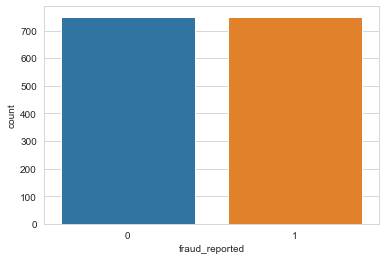

In [114]:
# Visualizing the data after oversampling
sns.countplot(y)

We have balanced the data using SMOTE.

# Best Random State

In [115]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.model_selection import train_test_split

In [116]:
maxAccu=0
maxRS=0
for i in range(200):
    x_train,x_test,y_train,y_test=train_test_split(x, y, test_size = 0.30, random_state = i)
    lr=LogisticRegression()
    lr.fit(x_train,y_train)
    predrs=lr.predict(x_test)
    acc=accuracy_score(y_test,predrs)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is :",maxAccu," on Random State :",maxRS)

Best accuracy is : 0.7977777777777778  on Random State : 93


In [117]:
# dividing the dataset for training and testing with best random state
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x, y, test_size=.30, random_state=maxRS)

In [118]:
x_train.shape

(1050, 36)

In [119]:
y_train.shape

(1050,)

In [120]:
x_test.shape

(450, 36)

In [121]:
y_test.shape

(450,)

In [122]:
# scaling the data using Standard Scaler
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.fit_transform(x_test)

# Logistic Regression

In [123]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,classification_report

In [124]:
lg=LogisticRegression()
lg.fit(x_train, y_train)
lg.score(x_train, y_train)
pred_lg=lg.predict(x_test)

print("accuracy score: ",accuracy_score(y_test,pred_lg))
print(confusion_matrix(y_test,pred_lg))
print(classification_report(y_test,pred_lg))

accuracy score:  0.7955555555555556
[[170  41]
 [ 51 188]]
              precision    recall  f1-score   support

           0       0.77      0.81      0.79       211
           1       0.82      0.79      0.80       239

    accuracy                           0.80       450
   macro avg       0.80      0.80      0.80       450
weighted avg       0.80      0.80      0.80       450



# Decision Tree Classifier

In [125]:
from sklearn.tree import DecisionTreeClassifier

In [126]:
dtc=DecisionTreeClassifier()
dtc.fit(x_train,y_train)
dtc.score(x_train,y_train)
pred_dtc=dtc.predict(x_test)

print("accuracy score: ",accuracy_score(y_test,pred_dtc))
print(confusion_matrix(y_test,pred_dtc))
print(classification_report(y_test,pred_dtc))

accuracy score:  0.7377777777777778
[[106 105]
 [ 13 226]]
              precision    recall  f1-score   support

           0       0.89      0.50      0.64       211
           1       0.68      0.95      0.79       239

    accuracy                           0.74       450
   macro avg       0.79      0.72      0.72       450
weighted avg       0.78      0.74      0.72       450



# GaussianNB Classifier

In [127]:
from sklearn.naive_bayes import GaussianNB

In [128]:
gnb=GaussianNB()
gnb.fit(x_train,y_train)
gnb.score(x_train,y_train)
pred_gnb=gnb.predict(x_test)

print("accuracy score: ",accuracy_score(y_test,pred_gnb))
print(confusion_matrix(y_test,pred_gnb))
print(classification_report(y_test,pred_gnb))

accuracy score:  0.8066666666666666
[[163  48]
 [ 39 200]]
              precision    recall  f1-score   support

           0       0.81      0.77      0.79       211
           1       0.81      0.84      0.82       239

    accuracy                           0.81       450
   macro avg       0.81      0.80      0.81       450
weighted avg       0.81      0.81      0.81       450



# Gradient Boosting Classifier

In [129]:
from sklearn.ensemble import GradientBoostingClassifier

In [130]:
gbc=GradientBoostingClassifier()
gbc.fit(x_train,y_train)
gbc.score(x_train,y_train)
pred_gcb=gbc.predict(x_test)

print("accuracy score: ",accuracy_score(y_test,pred_gcb))
print(confusion_matrix(y_test,pred_gcb))
print(classification_report(y_test,pred_gcb))

accuracy score:  0.7555555555555555
[[108 103]
 [  7 232]]
              precision    recall  f1-score   support

           0       0.94      0.51      0.66       211
           1       0.69      0.97      0.81       239

    accuracy                           0.76       450
   macro avg       0.82      0.74      0.74       450
weighted avg       0.81      0.76      0.74       450



# KNearest Neighbors Classifier

In [131]:
from sklearn.neighbors import KNeighborsClassifier

In [132]:
knn=KNeighborsClassifier()
knn.fit(x_train,y_train)
knn.score(x_train,y_train)
pred_knn=knn.predict(x_test)

print("accuracy score: ",accuracy_score(y_test,pred_knn))
print(confusion_matrix(y_test,pred_knn))
print(classification_report(y_test,pred_knn))

accuracy score:  0.6911111111111111
[[ 81 130]
 [  9 230]]
              precision    recall  f1-score   support

           0       0.90      0.38      0.54       211
           1       0.64      0.96      0.77       239

    accuracy                           0.69       450
   macro avg       0.77      0.67      0.65       450
weighted avg       0.76      0.69      0.66       450



# SVC

In [133]:
from sklearn.svm import SVC

In [134]:
svc = SVC()
svc.fit(x_train, y_train)
svc.score(x_train, y_train)
svc_pred = svc.predict(x_test)
print("accuracy score: ",accuracy_score(y_test,svc_pred))
print(confusion_matrix(y_test,svc_pred))
print(classification_report(y_test,svc_pred))

accuracy score:  0.8888888888888888
[[189  22]
 [ 28 211]]
              precision    recall  f1-score   support

           0       0.87      0.90      0.88       211
           1       0.91      0.88      0.89       239

    accuracy                           0.89       450
   macro avg       0.89      0.89      0.89       450
weighted avg       0.89      0.89      0.89       450



# Random Forest Classifier

In [135]:
from sklearn.ensemble import RandomForestClassifier

In [136]:
rfc=RandomForestClassifier()
rfc.fit(x_train,y_train)
rfc.score(x_train,y_train)
pred_rfc=rfc.predict(x_test)

print("accuracy score: ",accuracy_score(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))
print(classification_report(y_test,pred_rfc))

accuracy score:  0.9133333333333333
[[182  29]
 [ 10 229]]
              precision    recall  f1-score   support

           0       0.95      0.86      0.90       211
           1       0.89      0.96      0.92       239

    accuracy                           0.91       450
   macro avg       0.92      0.91      0.91       450
weighted avg       0.92      0.91      0.91       450



# XGB Classifier

In [137]:
from xgboost import XGBClassifier

In [138]:
xgb=XGBClassifier()
xgb.fit(x_train,y_train)
xgb.score(x_train,y_train)
pred_xgb=xgb.predict(x_test)

print("accuracy score: ",accuracy_score(y_test,pred_xgb))
print(confusion_matrix(y_test,pred_xgb))
print(classification_report(y_test,pred_xgb))

accuracy score:  0.8622222222222222
[[156  55]
 [  7 232]]
              precision    recall  f1-score   support

           0       0.96      0.74      0.83       211
           1       0.81      0.97      0.88       239

    accuracy                           0.86       450
   macro avg       0.88      0.86      0.86       450
weighted avg       0.88      0.86      0.86       450



# Extra Trees Classifier

In [139]:
from sklearn.ensemble import ExtraTreesClassifier

In [140]:
etc=ExtraTreesClassifier()
etc.fit(x_train,y_train)
etc.score(x_train,y_train)

pred_etc=etc.predict(x_test)
print("accuracy score: ",accuracy_score(y_test,pred_etc))
print(confusion_matrix(y_test,pred_etc))
print(classification_report(y_test,pred_etc))

accuracy score:  0.9177777777777778
[[187  24]
 [ 13 226]]
              precision    recall  f1-score   support

           0       0.94      0.89      0.91       211
           1       0.90      0.95      0.92       239

    accuracy                           0.92       450
   macro avg       0.92      0.92      0.92       450
weighted avg       0.92      0.92      0.92       450



From the above Classification Models, the highest accuracy score belongs to `Extra Trees Classifier`. Next, `Random Forest Classifier`, followed by `SVC model` & `XGBoost Classifier`.

Next, `GaussianNB Classifier, Logistic Regression Model, Decision Tree Classifier ` and `Gradient Boosting Classifier`.

The lowest Accuracy score belongs to `KNearest Neighbors Classifier`.

# Cross Validation Score

In [141]:
from sklearn.model_selection import cross_val_score

In [142]:
scr_lg=cross_val_score(lg,x,y,cv=5)
print("Cross validation score of this model is: ",scr_lg.mean())

Cross validation score of this model is:  0.738


In [143]:
scr_dtc=cross_val_score(dtc,x,y,cv=5)
print("Cross validation score of this model is: ",scr_dtc.mean())

Cross validation score of this model is:  0.8373333333333335


In [144]:
scr_gnb=cross_val_score(gnb,x,y,cv=5)
print("Cross validation score of this model is: ",scr_gnb.mean())

Cross validation score of this model is:  0.736


In [145]:
scr_gbc=cross_val_score(gbc,x,y,cv=5)
print("Cross validation score of this model is: ",scr_gbc.mean())

Cross validation score of this model is:  0.8800000000000001


In [146]:
scr_knn=cross_val_score(knn,x,y,cv=5)
print("Cross validation score of this model is: ",scr_knn.mean())

Cross validation score of this model is:  0.674


In [147]:
scr_svc=cross_val_score(svc,x,y,cv=5)
print("Cross validation score of this model is: ",scr_svc.mean())

Cross validation score of this model is:  0.8620000000000001


In [148]:
scr_rfc=cross_val_score(rfc,x,y,cv=5)
print("Cross validation score of this model is: ",scr_rfc.mean())

Cross validation score of this model is:  0.8826666666666666


In [149]:
scr_xgb=cross_val_score(xgb,x,y,cv=5)
print("Cross validation score of this model is: ",scr_xgb.mean())

Cross validation score of this model is:  0.8886666666666667


In [150]:
scr_etc=cross_val_score(etc,x,y,cv=5)
print("Cross validation score of this model is: ",scr_etc.mean())

Cross validation score of this model is:  0.9106666666666667


The highest Cross validation Score belongs to `Extra Trees Classifier`, followed by `XGBoost Classifier, Random Forest Classifier, Gradient Boosting Classifier & SVC model`.

Next, `Decision Tree Classifier, Logistic Regression model, GaussianNB Classifier`, and lastly, `KNearest Neighbors Classifier`.

# Hyper Parameter Tuning

Since the Cross Validation Score and the Accuracy Score of `Extra Trees Classifier` are both high, we shall consider this model for hyper parameter tuning.

We will use GridSearchCV for hyper parameter tuning.

In [151]:
from sklearn.model_selection import GridSearchCV

In [156]:
parameters = {'criterion' : ['gini','entropy'],
              'random_state' : [10, 50, 1000],
              'max_depth' : [0, 10, 20],
              'n_jobs' : [-2, -1, 1],
              'n_estimators' : [50, 100, 200, 300]}
grid_etc=GridSearchCV(etc, param_grid = parameters, cv = 8)

In [157]:
grid_etc.fit(x_train, y_train)

GridSearchCV(cv=8, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1],
                         'random_state': [10, 50, 1000]})

In [158]:
grid_etc.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'n_estimators': 100,
 'n_jobs': -2,
 'random_state': 1000}

In [159]:
etc1=ExtraTreesClassifier(criterion='entropy',random_state=1000,max_depth=20,n_jobs=-2,n_estimators=100)

etc1.fit(x_train,y_train)
pred=etc1.predict(x_test)
print("accuracy score: ",accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

accuracy score:  0.9244444444444444
[[188  23]
 [ 11 228]]
              precision    recall  f1-score   support

           0       0.94      0.89      0.92       211
           1       0.91      0.95      0.93       239

    accuracy                           0.92       450
   macro avg       0.93      0.92      0.92       450
weighted avg       0.93      0.92      0.92       450



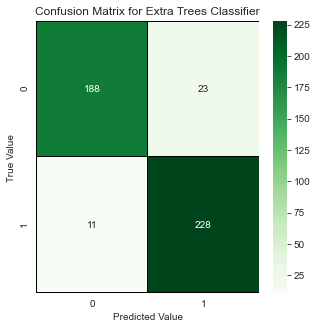

In [160]:
cm = confusion_matrix(y_test, pred)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f, ax = plt.subplots(figsize =(5,5))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Greens", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("Predicted Value")
plt.ylabel("True Value ")
plt.title('Confusion Matrix for Extra Trees Classifier')
plt.show()

# ROC-AUC Curve

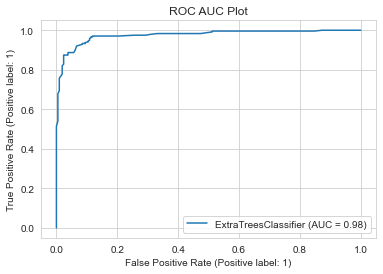

In [161]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(etc1,x_test,y_test)
plt.title("ROC AUC Plot")
plt.show()

We have plotted the ROC-AUC curve, AUC score is `98 %`.

# Saving the Model

In [162]:
import joblib
joblib.dump(etc1,"Insurance_Claim_Fraud_Detection.pkl")

['Insurance_Claim_Fraud_Detection.pkl']

# Prediction

In [163]:
# Loading the saved model
fraud_detection_model=joblib.load("Insurance_Claim_Fraud_Detection.pkl")

# Prediction
prediction = fraud_detection_model.predict(x_test)
prediction

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0,
       1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0,
       0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1,
       1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0,
       0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1,
       1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0,
       0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1,

In [164]:
pd.DataFrame([fraud_detection_model.predict(x_test)[:],y_test[:]],index=["Predicted Value","Actual Value"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449
Predicted Value,1,1,1,1,1,1,1,1,1,0,1,1,1,0,1,1,1,1,1,1,1,1,0,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,0,0,0,0,1,0,1,0,1,0,1,0,1,1,1,1,1,1,0,1,1,1,0,0,1,1,1,0,0,1,0,0,1,0,1,1,1,1,0,0,1,1,1,0,0,1,1,1,1,1,0,0,1,1,1,0,0,0,0,0,1,1,1,0,0,0,1,1,1,1,1,1,1,0,0,1,0,0,0,0,1,0,1,1,0,0,1,1,0,1,0,1,0,1,1,1,0,0,0,1,1,0,1,1,1,1,1,1,1,0,1,0,0,1,0,0,0,1,0,1,0,1,1,0,0,0,1,1,1,0,1,1,0,0,1,1,0,1,1,1,0,0,1,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,1,1,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,1,0,0,1,1,0,1,1,1,1,0,1,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,1,0,0,0,0,1,1,0,0,0,1,0,1,1,0,1,0,1,1,1,1,0,1,0,0,1,1,1,0,0,0,0,0,1,1,1,0,0,0,1,1,1,0,1,0,0,1,0,1,0,0,1,1,1,1,0,0,0,1,0,1,0,0,1,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,1,0,1,0,1,1,1,1,0,1,1,0,1,1,1,0,1,0,1,1,1,0,0,0,0,1,0,1,1,0,0,1,1,1,0,0,0,1,0,1,1,1,1,1,1,1,0,0,1,0,0,1,0,1,1,0,1,1,1,0,0,1,0,1,0,1,0,1,0,0,1,0,1,0,0,1,1,0,0,1,0,1,1,1,0,1,1,0,1,0,1,1,1,0,0,0,1,1,1,1,0,1,1,1,1,1,0,1,1,0,1,1,1,0,0,0,1
Actual Value,1,1,1,1,1,1,1,1,1,0,1,1,1,0,1,1,1,1,1,1,1,1,0,1,0,0,1,0,1,1,0,1,1,0,1,1,0,1,0,1,0,0,1,0,1,0,1,0,1,0,1,1,1,1,1,0,0,1,0,1,0,0,1,1,1,0,0,1,0,0,1,1,1,1,1,1,0,0,1,1,1,0,0,1,0,0,1,1,0,0,1,1,1,1,0,0,0,0,1,1,1,0,0,1,0,1,1,1,0,1,1,0,0,1,0,0,0,0,1,0,1,1,1,0,1,1,0,1,0,1,0,1,1,1,0,0,0,1,1,0,1,1,1,1,0,1,1,0,1,0,0,1,0,0,0,1,0,1,0,1,1,0,0,1,1,1,1,0,1,1,0,0,1,1,0,1,1,1,0,0,1,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,0,1,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,1,0,0,1,1,0,1,0,1,1,0,1,1,1,0,0,1,0,1,0,1,1,1,1,0,0,1,0,1,0,1,1,0,1,0,0,0,0,1,1,0,0,0,1,0,1,1,0,1,0,1,1,0,1,0,0,0,0,1,1,1,0,0,0,0,0,1,1,1,0,0,0,1,1,1,0,1,1,0,1,0,1,0,0,1,1,1,1,0,0,0,0,0,1,1,0,1,0,1,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,1,0,1,1,1,1,0,1,1,0,1,1,1,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,1,1,0,0,0,1,0,1,1,1,1,1,1,1,0,0,1,0,0,0,0,1,1,0,1,0,1,0,0,1,0,1,0,1,0,1,0,0,1,0,1,0,0,1,1,0,1,1,0,1,1,1,0,1,1,0,1,0,1,1,1,0,0,0,1,0,1,0,0,1,1,0,1,1,0,1,1,0,1,1,1,0,0,0,1


The above shows the predicted values and the actual values.The values are almost similar.